# Feed Forward Neural Network Test on Kaggle Data-set

Ref: [Click here](https://learnopencv.com/understanding-feedforward-neural-networks/#:~:text=Given%20below%20is%20an%20example,can%20be%20multiple%20hidden%20layers.)

In [1]:
from PIL import Image
from IPython.display import display
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import pylab, random, os, math, sklearn
import numpy as np
import tensorflow as tf

# To cancel scientific notation
np.set_printoptions(suppress=True)

%matplotlib inline
# %matplotlib tk
%config InlineBackend.figure_format = 'retina'
 
# To set plotting style
plt.style.use("classic")
plt.style.use("bmh")
plt.style.use("seaborn-whitegrid")

# To hide warnings
import warnings
warnings.filterwarnings("ignore")


# 1. Feed Forward Neural Network Introduction

**Feedforward Neural Networks**, also known as Deep feedforward Networks or Multi-layer Perceptrons. They form the basis of many important Neural Networks being used in the recent times, such as **Convolutional Neural Networks** ( used extensively in computer vision applications ), **Recurrent Neural Networks** ( widely used in Natural language understanding and sequence learning) and so on. 

## 1.1 Neural Network 

<img src="https://cdn.mathpix.com/snip/images/XsOdRsY3MSufMShaGZ-EfNGM9Re4GnaGapUA6fuBrXw.original.fullsize.png" width="60%">

No feedback connections or loops in the network. 

It has an **input layer**, an **output layer**, and a **hidden layer**. 

> In general, there can be multiple hidden layers. 

Each node in the layer is a **Neuron**, which can be thought of as the basic processing unit of a Neural Network.

> It works in two steps – It calculates the **weighted sum** of its inputs and then applies an **activation function** to normalize the sum. The activation functions can be linear or nonlinear. Also, there are weights associated with each input of a neuron. These are the parameters which the network has to learn during the training phase.

<img src="https://cdn.mathpix.com/snip/images/UEAChlQurRwcF0DrTzjKAaeLH1r5AInP-gQaX5QaFpA.original.fullsize.png" width="60%">

The neuron learns Linear or Non-linear decision boundaries based on the activation function. 

> **Sigmoid**
It maps the input ( x axis ) to values between 0 and 1.
>
> <img src="https://cdn.mathpix.com/snip/images/cO_6ggxFR0b3MAwwfLMitWlYD3BItO6iOcog_3teqps.original.fullsize.png" width="60%">
>
> **Tanh**
It is similar to the sigmoid function butmaps the input to values between -1 and 1.
>
> <img src="https://cdn.mathpix.com/snip/images/GSDDW1YlnNQJX2vkX3QzeCV4ErHdbOH32GgqX5P8d4Y.original.fullsize.png" width="60%">
>
> **Rectified Linear Unit (ReLU)**
It allows only positive values to pass through it. The negative values are mapped to zero.
>
> <img src="https://cdn.mathpix.com/snip/images/IMQZtgStv9dUlgzo6QiqmUJhVk8bSq0k5nIDZCBY56s.original.fullsize.png" width="60%">

The first layer of a neural network is used to provide the **input data** or features to the network.

The output layer which gives out the predictions. The activation function to be used in this layer is different for different problems.

A feedforward network applies a series of functions to the input. By having multiple hidden layers, we can compute complex functions by cascading simpler functions. 

> The choice of hidden units is a very active research area in Machine Learning. The type of hidden layer distinguishes the different types of Neural Networks like CNNs, RNNs etc. The number of hidden layers is termed as the depth of the neural network. 

The training samples are passed through the network and the output obtained from the network is compared with the actual output. This error is used to change the weights of the neurons such that the error decreases gradually. This is done using the **Backpropagation** algorithm, also called backprop. Iteratively passing batches of data through the network and updating the weights, so that the error is decreased, is known as **Stochastic Gradient Descent (SGD)**. The amount by which the weights are changed is determined by a parameter called Learning rate. The details of SGD and backprop will be covered in a separate post.

# 2. Use MNIST Data-set to Build a Simple FNN Model

## 2.1 Load Data

In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
x_train[0][10]

array([  0,   0,   0,   0,   0,   0,   0,   0,   0,  14,   1, 154, 253,
        90,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0], dtype=uint8)

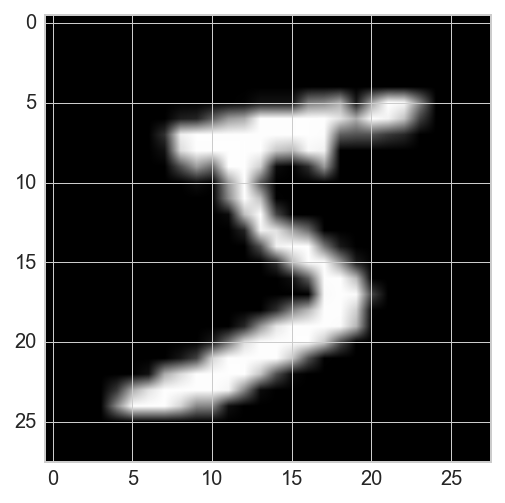

In [3]:
plt.imshow(x_train[0], cmap="gray")
plt.show()

In [4]:
y_train[0]

5

In [5]:
x_train.shape

(60000, 28, 28)

In [6]:
x_test.shape

(10000, 28, 28)

## 2.1 Data Normalization

In [7]:
x_train=tf.keras.utils.normalize(x_train,axis=1)
x_test=tf.keras.utils.normalize(x_test,axis=1)

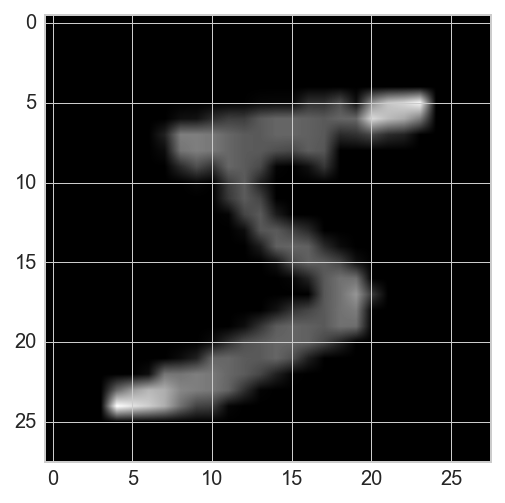

In [8]:
plt.imshow(x_train[0], cmap="gray")
plt.show()

In [9]:
x_train[0][10]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.0253731 ,
       0.00171577, 0.22713296, 0.33153488, 0.11664776, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ])

## 2.2 Build Network

Input layer 748, 2 hidden layers 128, output layer 10.

In [10]:
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(128,activation=tf.nn.relu))
model.add(tf.keras.layers.Dense(128,activation=tf.nn.relu))
model.add(tf.keras.layers.Dense(10,activation=tf.nn.softmax))
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

## 2.3 Train the Model

In [11]:
model.fit(x_train,y_train,epochs=5) 

Train on 60000 samples
Epoch 1/5
60000/60000 [==============================] - 7s 122us/sample - loss: 0.2633 - accuracy: 0.9225
Epoch 2/5
60000/60000 [==============================] - 7s 109us/sample - loss: 0.1055 - accuracy: 0.9678
Epoch 3/5
60000/60000 [==============================] - 6s 103us/sample - loss: 0.0721 - accuracy: 0.9773
Epoch 4/5
60000/60000 [==============================] - 6s 103us/sample - loss: 0.0531 - accuracy: 0.9828
Epoch 5/5
60000/60000 [==============================] - 6s 98us/sample - loss: 0.0403 - accuracy: 0.9867


## 2.3 Evaluation

In [12]:
%%capture 
val_loss, val_acc = model.evaluate(x_test,y_test)

In [13]:
val_loss

0.11925618644256611

In [14]:
val_acc

0.9659

In [15]:
predictions = model.predict([x_test[:11]])
x = predictions > 0.5
[np.array([0,1,2,3,4,5,6,7,8,9])[x[i]][0] for i in range(10)]

[7, 2, 1, 0, 4, 1, 4, 9, 5, 9]

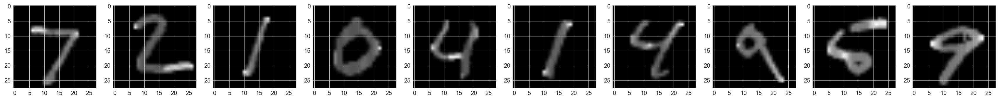

In [16]:
plt.figure(figsize=(30,3))
for i in range(10):
    plt.subplot(1,10,i+1)
    plt.imshow(x_test[i], cmap="gray")
plt.show()

In [17]:
y_test[:10]

array([7, 2, 1, 0, 4, 1, 4, 9, 5, 9], dtype=uint8)

# 3. Kaggle Crack Test

## 3.1. Load Data

How to load data by `tf` is demonstrated at [here](https://www.tensorflow.org/tutorials/load_data/images).

In [18]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array

def load_crack_image(cracked_path, uncracked_path, color_mode="grayscale"):
    cracked_list = os.listdir(cracked_path)
    uncracked_list = os.listdir(uncracked_path)
    cracked = np.array([img_to_array(load_img(cracked_path + img, 
                          color_mode=color_mode)) for img in cracked_list])
    uncracked = np.array([img_to_array(load_img(uncracked_path + img, 
                    color_mode=color_mode)) for img in uncracked_list])
    cracked = cracked.reshape((cracked.shape[0], cracked.shape[1], cracked.shape[2]))
    uncracked = uncracked.reshape((uncracked.shape[0], uncracked.shape[1], uncracked.shape[2]))
    return cracked, uncracked

cracked_path = "/Users/ray/Desktop/crack-images/kaggle-data/train/cracked/"
uncracked_path = "/Users/ray/Desktop/crack-images/kaggle-data/train/uncracked/"
cracked, uncracked = load_crack_image(cracked_path, uncracked_path)

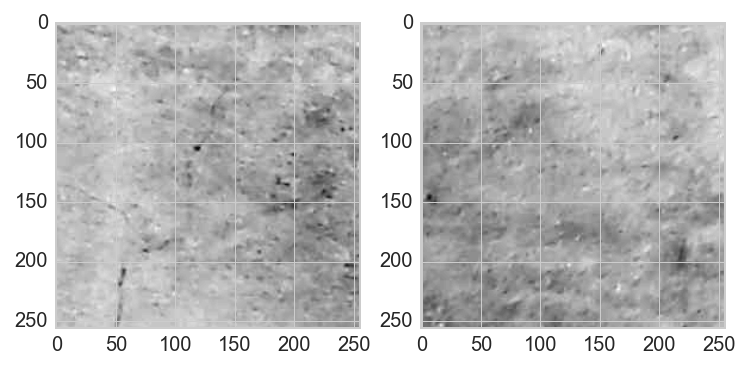

In [19]:
plt.subplot(121)
plt.imshow(cracked[0], cmap="gray")
plt.subplot(122)
plt.imshow(uncracked[0], cmap="gray")
plt.show()

In [20]:
def crack_split(cracked, uncracked):
    y_cracked = np.ones(cracked.shape[0])
    y_uncracked = np.zeros(uncracked.shape[0])
    y = np.concatenate([y_cracked, y_uncracked])
    x = np.concatenate([cracked, uncracked])
    x_train, x_test, y_train, y_test = train_test_split(
        x, y, test_size=0.2, random_state=100)
    x_train = tf.keras.utils.normalize(x_train, axis=1)
    x_test = tf.keras.utils.normalize(x_test, axis=1)
    return x_train, x_test, y_train, y_test

x_train, x_test, y_train, y_test = crack_split(cracked, uncracked)

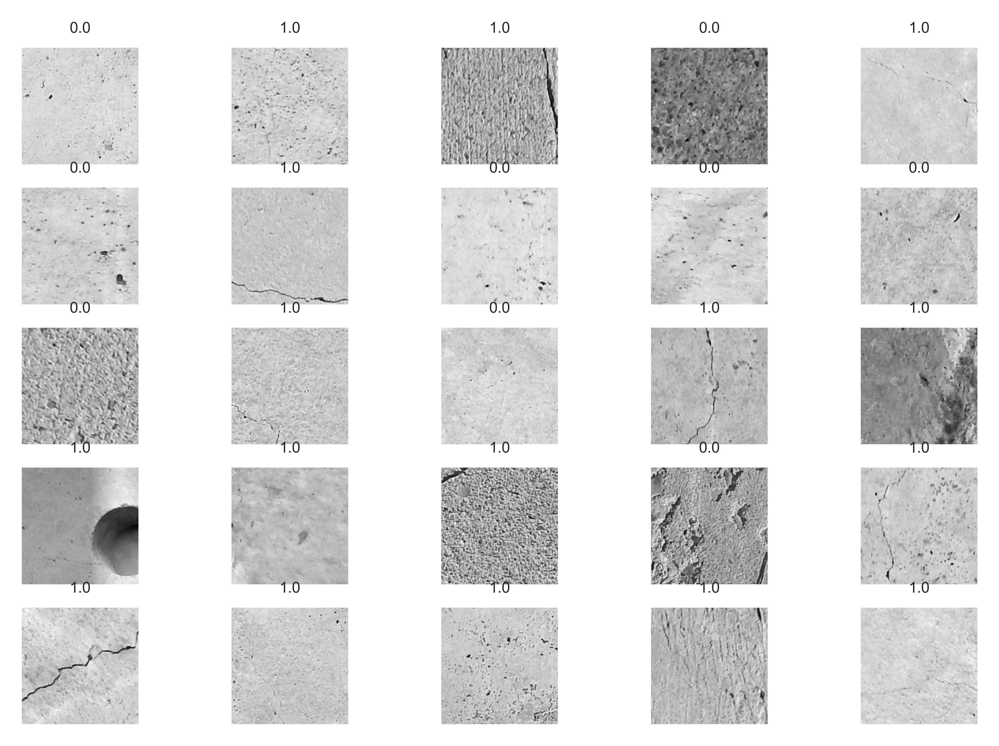

In [21]:
plt.figure(dpi=500)
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(x_train[i], cmap="gray")
    plt.title(y_train[i], fontsize=5)
    plt.axis('off')
plt.show()

In [22]:
y_test[:100]

array([0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 0., 1., 0., 1., 1., 0., 1., 1., 1., 1., 1., 0., 0., 0., 1.,
       1., 1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 1., 1., 1., 1., 1.,
       1., 0., 1., 1., 0., 0., 1., 1., 1., 0., 0., 0., 1., 1., 1.])

## 3.2 Simple Histogram Equilization

In [23]:
def histeq(im,nbr_bins=256):
    """ Histogram equalization of a grayscale image. """
    # get image histogram
    imhist,bins = np.histogram(im.flatten(),nbr_bins,normed=True) 
    cdf = imhist.cumsum() # cumulative distribution function 
    cdf = 255 * cdf / cdf[-1] # normalize
    # use linear interpolation of cdf to find new pixel values
    im2 = np.interp(im.flatten(),bins[:-1],cdf)
    return im2.reshape(im.shape)

In [24]:
for i in range(len(x_train)):
    x_train[i] = histeq(x_train[i], 5)
for i in range(len(x_test)):
    x_test[i] = histeq(x_test[i], 5)
x_train = tf.keras.utils.normalize(x_train, axis=1)
x_test = tf.keras.utils.normalize(x_test, axis=1)

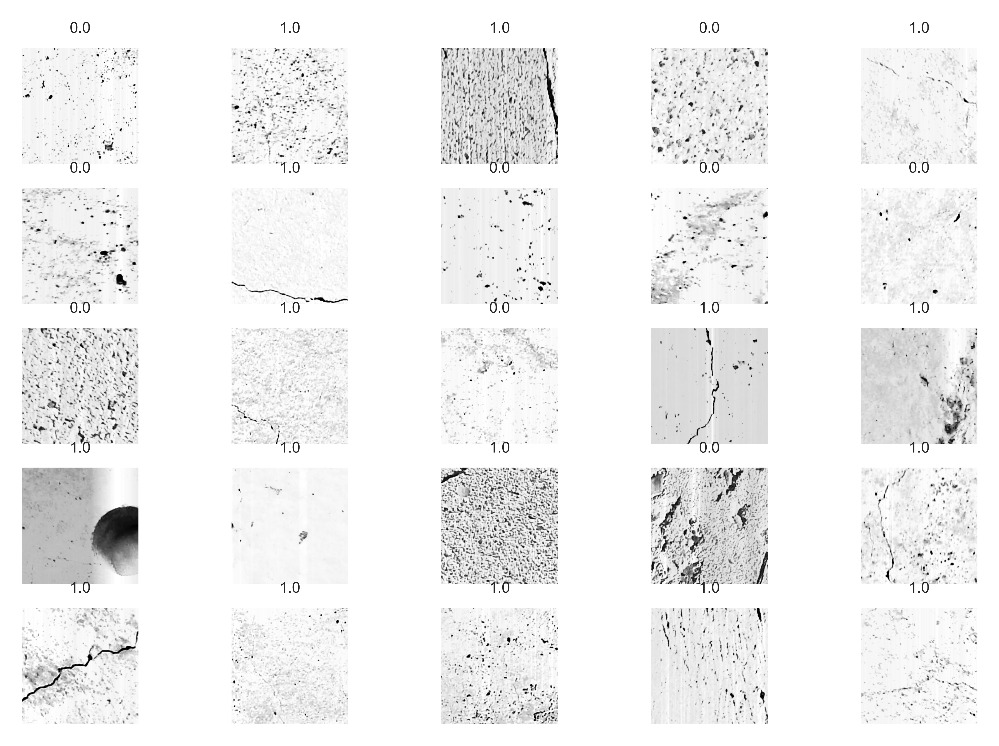

In [25]:
plt.figure(dpi=500)
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(x_train[i], cmap="gray")
    plt.title(y_train[i], fontsize=5)
    plt.axis('off')
plt.show()

## 3.3 Build Network

In [26]:
def FNN_Model():
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(128, activation=tf.nn.relu))
    model.add(tf.keras.layers.Dense(64,activation=tf.nn.relu))
    model.add(tf.keras.layers.Dense(1,activation=tf.nn.sigmoid))
    model.compile(optimizer='adam',loss=tf.keras.losses.BinaryCrossentropy(),
                  metrics=[tf.keras.metrics.BinaryAccuracy(),
                          tf.keras.metrics.Precision(),
                          tf.keras.metrics.TruePositives()])
    return model

model = FNN_Model()

## 3.4 Train the Model

In [27]:
model.fit(x_train,y_train,epochs=5) 

Train on 11974 samples
Epoch 1/5
11974/11974 [==============================] - 29s 2ms/sample - loss: 0.7385 - binary_accuracy: 0.5084 - precision: 0.5090 - true_positives: 2958.0000
Epoch 2/5
11974/11974 [==============================] - 27s 2ms/sample - loss: 0.7063 - binary_accuracy: 0.4991 - precision: 0.4995 - true_positives: 3470.0000
Epoch 3/5
11974/11974 [==============================] - 27s 2ms/sample - loss: 0.6960 - binary_accuracy: 0.4947 - precision: 0.4953 - true_positives: 3091.0000
Epoch 4/5
11974/11974 [==============================] - 29s 2ms/sample - loss: 0.6933 - binary_accuracy: 0.4901 - precision: 0.4932 - true_positives: 4154.0000
Epoch 5/5
11974/11974 [==============================] - 26s 2ms/sample - loss: 0.6932 - binary_accuracy: 0.4963 - precision: 0.4978 - true_positives: 4460.00003s - loss: 0.6932 - binary_accuracy: 0.


In [28]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          multiple                  0         
_________________________________________________________________
dense_3 (Dense)              multiple                  8388736   
_________________________________________________________________
dense_4 (Dense)              multiple                  8256      
_________________________________________________________________
dense_5 (Dense)              multiple                  65        
Total params: 8,397,057
Trainable params: 8,397,057
Non-trainable params: 0
_________________________________________________________________


## 4.4 Evaluation

In [29]:
%%capture 
val_loss, val_acc, val_pre, val_TP = model.evaluate(x_test,y_test)

In [30]:
result = {}
result["original"] = [val_loss, val_acc, val_pre, val_TP/(y_test == 1).sum()]
val_loss, val_acc, val_pre, val_TP/(y_test == 1).sum()

(0.6931666954804359, 0.49565798, 0.0, 0.0)

In [31]:
predictions = model.predict([x_test[:10]])
predictions

array([[0.49899295],
       [0.49899295],
       [0.49899295],
       [0.49899295],
       [0.49899295],
       [0.49899295],
       [0.49899295],
       [0.49899295],
       [0.49899292],
       [0.49899292]], dtype=float32)

In [32]:
y_test[:10]

array([0., 0., 0., 1., 0., 0., 0., 0., 1., 0.])

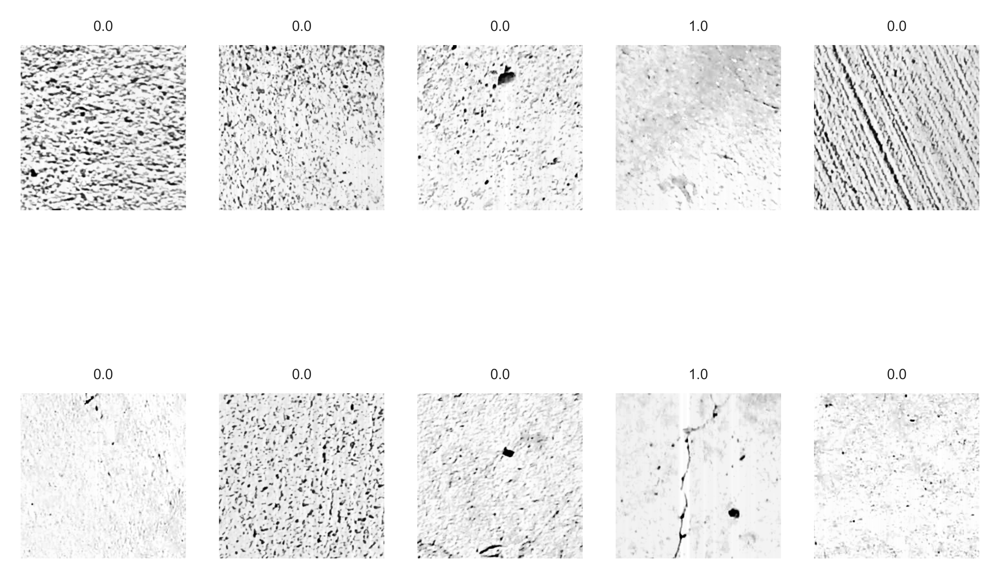

In [33]:
plt.figure(dpi=500)
for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(x_test[i], cmap="gray")
    plt.title(y_test[i], fontsize=5)
    plt.axis('off')
plt.show()

# 4. Preprocessed Data Test (Victor - Cranny)

In [34]:
cracked_path = "/Users/ray/Desktop/crack-images/Canny/train/cracked/"
uncracked_path = "/Users/ray/Desktop/crack-images/Canny/train/uncracked/"
cracked, uncracked = load_crack_image(cracked_path, uncracked_path)

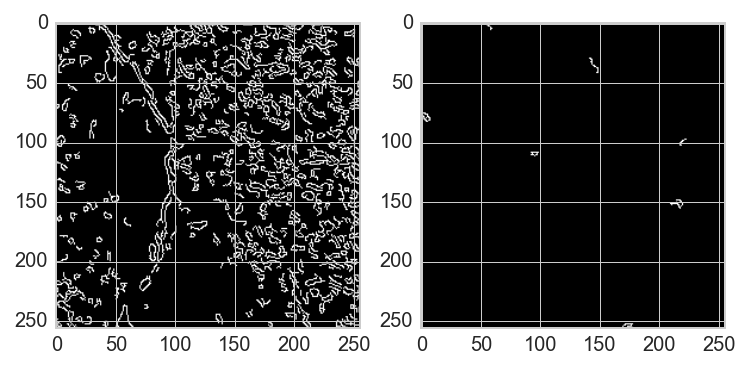

In [35]:
plt.subplot(121)
plt.imshow(cracked[0], cmap="gray")
plt.subplot(122)
plt.imshow(uncracked[0], cmap="gray")
plt.show()

In [36]:
x_train, x_test, y_train, y_test = crack_split(cracked, uncracked)
model = FNN_Model()
model.fit(x_train,y_train,epochs=5) 

Train on 11974 samples
Epoch 1/5
11974/11974 [==============================] - 28s 2ms/sample - loss: 0.6971 - binary_accuracy: 0.5175 - precision_1: 0.5166 - true_positives_1: 3316.0000
Epoch 2/5
11974/11974 [==============================] - 28s 2ms/sample - loss: 0.5098 - binary_accuracy: 0.7557 - precision_1: 0.7521 - true_positives_1: 4574.0000
Epoch 3/5
11974/11974 [==============================] - 27s 2ms/sample - loss: 0.0870 - binary_accuracy: 0.9678 - precision_1: 0.9751 - true_positives_1: 5752.0000
Epoch 4/5
11974/11974 [==============================] - 28s 2ms/sample - loss: 0.0311 - binary_accuracy: 0.9869 - precision_1: 0.9963 - true_positives_1: 5856.0000
Epoch 5/5
11974/11974 [==============================] - 29s 2ms/sample - loss: 0.0199 - binary_accuracy: 0.9903 - precision_1: 1.0000 - true_positives_1: 5875.0000


In [37]:
%%capture 
val_loss, val_acc, val_pre, val_TP = model.evaluate(x_test,y_test)

In [38]:
result["canny"] = [val_loss, val_acc, val_pre, val_TP/(y_test == 1).sum()]
val_loss, val_acc, val_pre, val_TP/(y_test == 1).sum()

(1.5898031484467552, 0.5340681, 0.534912, 0.5834437086092715)

# 5. Preprocessed Data Test (Victor - TH)

In [39]:
cracked_path = "/Users/ray/Desktop/crack-images/TH/train/cracked/"
uncracked_path = "/Users/ray/Desktop/crack-images/TH/train/uncracked/"
cracked, uncracked = load_crack_image(cracked_path, uncracked_path)

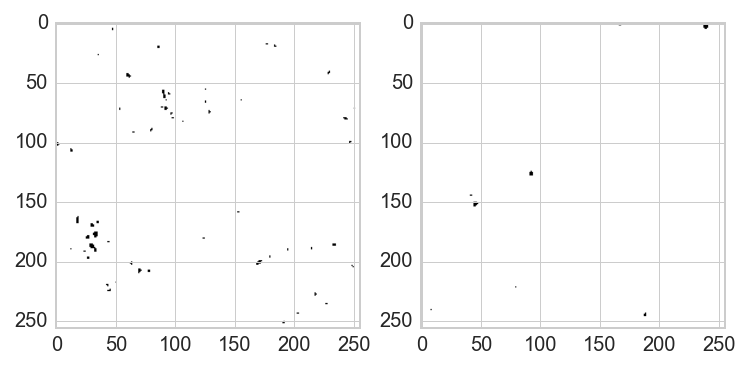

In [40]:
plt.subplot(121)
plt.imshow(cracked[0], cmap="gray")
plt.subplot(122)
plt.imshow(uncracked[0], cmap="gray")
plt.show()

In [41]:
x_train, x_test, y_train, y_test = crack_split(cracked, uncracked)
model = FNN_Model()
model.fit(x_train,y_train,epochs=5) 

Train on 11974 samples
Epoch 1/5
11974/11974 [==============================] - 30s 3ms/sample - loss: 0.7297 - binary_accuracy: 0.5029 - precision_2: 0.5031 - true_positives_2: 3178.0000
Epoch 2/5
11974/11974 [==============================] - 27s 2ms/sample - loss: 0.7013 - binary_accuracy: 0.5172 - precision_2: 0.5156 - true_positives_2: 3477.0000
Epoch 3/5
11974/11974 [==============================] - 27s 2ms/sample - loss: 0.6915 - binary_accuracy: 0.5259 - precision_2: 0.5245 - true_positives_2: 3358.0000
Epoch 4/5
11974/11974 [==============================] - 30s 2ms/sample - loss: 0.6928 - binary_accuracy: 0.5121 - precision_2: 0.5131 - true_positives_2: 2915.0000
Epoch 5/5
11974/11974 [==============================] - 27s 2ms/sample - loss: 0.6916 - binary_accuracy: 0.5227 - precision_2: 0.5203 - true_positives_2: 3538.0000


In [42]:
%%capture 
val_loss, val_acc, val_pre, val_TP = model.evaluate(x_test,y_test)

In [43]:
result["thresholding"] = [val_loss, val_acc, val_pre, val_TP/(y_test == 1).sum()]
val_loss, val_acc, val_pre, val_TP/(y_test == 1).sum()

(0.6898806330834378, 0.49565798, 0.0, 0.0)

# 6. Preprocessed Data Test (Victor - XCSLBP)

In [44]:
cracked_path = "/Users/ray/Desktop/crack-images/XCSLBP/train/cracked/"
uncracked_path = "/Users/ray/Desktop/crack-images/XCSLBP/train/uncracked/"
cracked, uncracked = load_crack_image(cracked_path, uncracked_path)

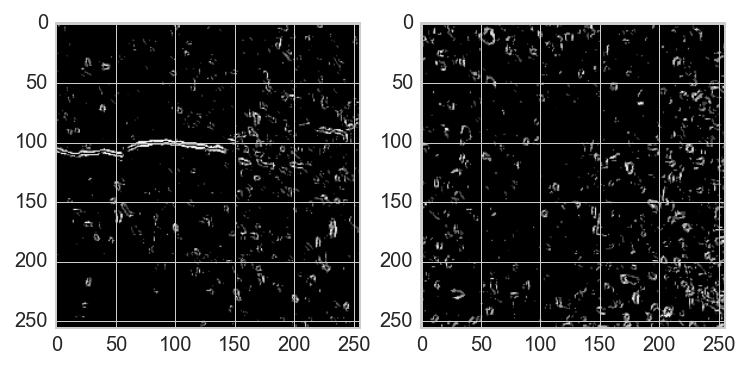

In [45]:
plt.subplot(121)
plt.imshow(cracked[0], cmap="gray")
plt.subplot(122)
plt.imshow(uncracked[0], cmap="gray")
plt.show()

In [46]:
x_train, x_test, y_train, y_test = crack_split(cracked, uncracked)
model = FNN_Model()
model.fit(x_train,y_train,epochs=5) 

Train on 11974 samples
Epoch 1/5
11974/11974 [==============================] - 29s 2ms/sample - loss: 0.6981 - binary_accuracy: 0.5276 - precision_3: 0.5251 - true_positives_3: 3507.0000
Epoch 2/5
11974/11974 [==============================] - 26s 2ms/sample - loss: 0.5447 - binary_accuracy: 0.7289 - precision_3: 0.7352 - true_positives_3: 4290.0000
Epoch 3/5
11974/11974 [==============================] - 29s 2ms/sample - loss: 0.1819 - binary_accuracy: 0.9281 - precision_3: 0.9336 - true_positives_3: 5523.0000
Epoch 4/5
11974/11974 [==============================] - 28s 2ms/sample - loss: 0.0608 - binary_accuracy: 0.9799 - precision_3: 0.9829 - true_positives_3: 5852.0000
Epoch 5/5
11974/11974 [==============================] - 32s 3ms/sample - loss: 0.0204 - binary_accuracy: 0.9937 - precision_3: 0.9955 - true_positives_3: 5943.0000


In [47]:
%%capture 
val_loss, val_acc, val_pre, val_TP = model.evaluate(x_test,y_test)

In [48]:
result["XCSLBP"] = [val_loss, val_acc, val_pre, val_TP/(y_test == 1).sum()]
val_loss, val_acc, val_pre, val_TP/(y_test == 1).sum()

(1.727464633220502, 0.5400802, 0.5500376, 0.48410596026490066)

# 7. Comparison

In [49]:
import pandas as pd
result = pd.DataFrame(result)
result.index = ["loss", "Accuracy", "Precision", "TPR"]
result

,original,canny,thresholding,XCSLBP
loss,0.693167,1.589803,0.689881,1.727465
Accuracy,0.495658,0.534068,0.495658,0.540080
Precision,0.000000,0.534912,0.000000,0.550038
TPR,0.000000,0.583444,0.000000,0.484106
